In [ ]:
# import numpy and load sample data
import numpy as np
pic_path = '/content/drive/MyDrive/Colab Notebooks/data/graphics/graphics/nonrigid3d/michael0.vert'
data = np.loadtxt(pic_path)

(3400, 3)
(3400, 3)


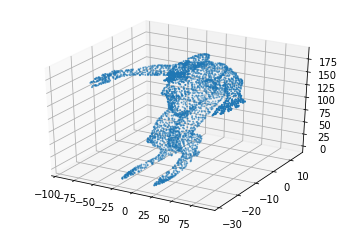

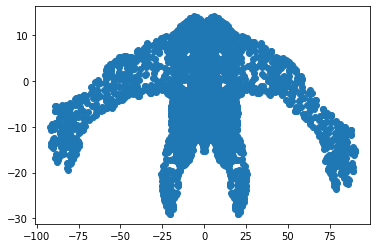

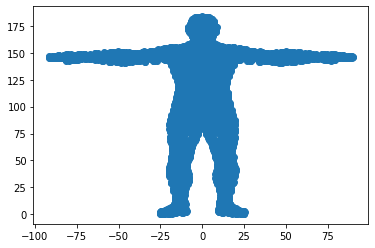

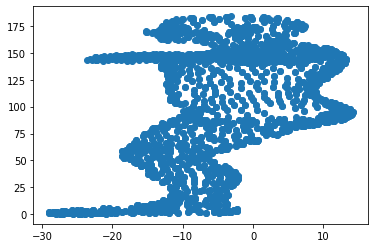

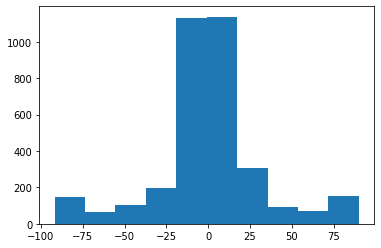

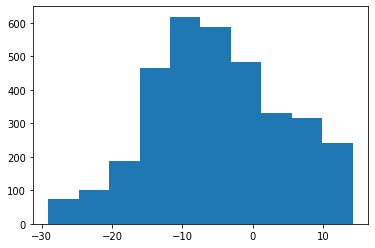

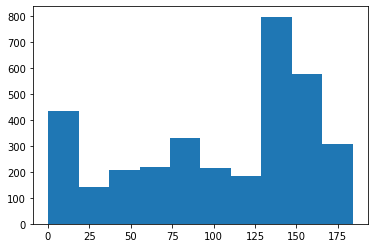

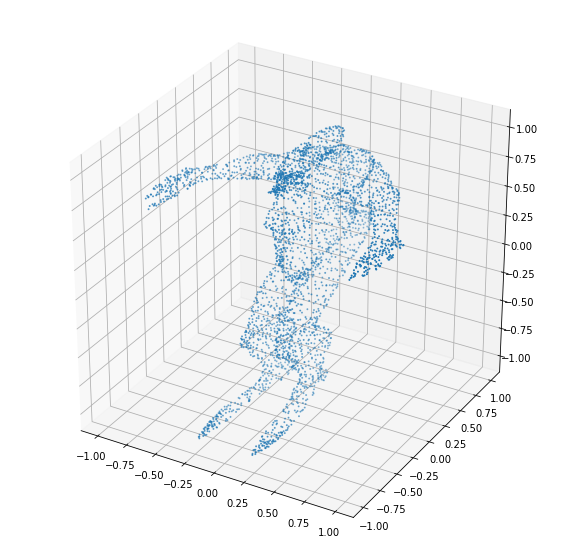

In [ ]:
# now plot it in 3-D as well as various projections
import matplotlib.pyplot as plt
from sklearn import preprocessing
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data.T[0], data.T[1], data.T[2], s=1)
plt.show()

# looking down, a projection onto 1st and 2nd axis
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(data.T[0], data.T[1])
plt.show()

# looking at the front, a projection onto 1st and 3rd axis
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(data.T[0], data.T[2])
plt.show()

# looking at the side, a projection onto 2nd and 3rd axis
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(data.T[1], data.T[2])
plt.show()

# distribution of points on the front of the figure
fig = plt.figure()
ax = fig.add_subplot(111)
ax.hist(data.T[0])
plt.show()

# distribution of points on the side of the figure
fig = plt.figure()
ax = fig.add_subplot(111)
ax.hist(data.T[1])
plt.show()

# distribution of points on the height of the figure
fig = plt.figure()
ax = fig.add_subplot(111)
ax.hist(data.T[2])
plt.show()

# normalize so as to make the epsilon parameter search easier
data_concat = np.transpose(np.stack((data.T[0], data.T[1], data.T[2]), axis=0))
print(np.shape(data_concat))
scaler = preprocessing.MinMaxScaler(feature_range=(-1,1))
data_norm = scaler.fit_transform(data_concat)
print(np.shape(data_norm))

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data_norm[:,0], data_norm[:,1], data_norm[:,2], s=1)
plt.show()

In [ ]:
# install kepler mapper, a library implementing the Mapper algorithm
%pip install kmapper

In [ ]:
# import KeplerMapper and sklearn to create an object to work with
import kmapper as km
mapper = km.KeplerMapper(verbose=1)

KeplerMapper(verbose=1)


..Projecting on data shaped (3400, 3)

..Projecting data using: l2norm


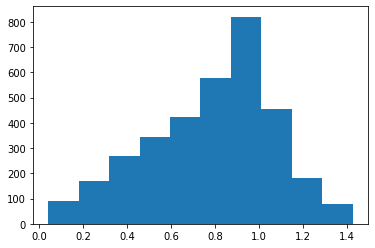

In [ ]:
# create the our "lens" or "filter". This is often a projection into a lower dimensional space. Projection parameter is either a string, a Scikit-learn class with fit_transform like manifold.TSNE(), 
# or a list of dimension indices. For example the strings can be 'min', 'max', or 'avg'. Project using the l2-norm, the idead being that extremeties have larger l2-norm
lens = mapper.project(data_norm, projection='l2norm', scaler=None)

# what does the distribution of projected data look like?
fig = plt.figure()
ax = fig.add_subplot(111)
ax.hist(lens)
plt.show()

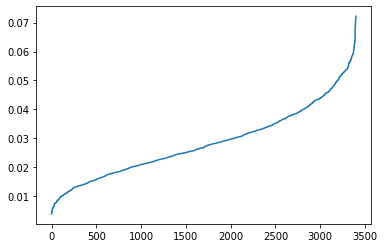

In [ ]:
"""
For DBSCAN, there are two parameters. The first parameter is the epsilon radius that is used decide which points are neighbors of a given point.
The second parameter is the minimum number of points needed in a neighborhood of a given point in order to be considered a "core point" in the algorithm.
These parameters are data dependent. A small value of epsilon means that less dense clusters will be missed and considered outliers/noise.
A large value of epsilon may merge denser clusters together.

Use a plot to find an ideal value of epsilon. DBSCAN is very sensitive to the scale of the data since epsilon is a distance parameter.
The plot is the sorted average distance from each point to it's k-nearest neighbors. The heuristic is to use the value of epsilon in the 'crook' of curvature.
This value (~.06) turned out to make the resulting graph 
"""

from sklearn.neighbors import NearestNeighbors

neighbors = NearestNeighbors(n_neighbors=6)
neighbors_fit = neighbors.fit(data_norm)
distances, indeces = neighbors_fit.kneighbors(data_norm)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [ ]:
# now cluster based on the original non-projected data with number of intervals (cubes) in the cover and the percent overlap between those intervals as parameters. How do these affect the resulting graph?
from sklearn import cluster
graph = mapper.map(lens, data_norm, clusterer=cluster.DBSCAN(eps=.15, min_samples=6),
                   cover=km.Cover(n_cubes=10, perc_overlap=0.15))


Mapping on data shaped (3400, 3) using lens shaped (3400, 1)

Creating 10 hypercubes.

Created 29 edges and 30 nodes in 0:00:00.043403.


In [ ]:
# make a line plot showing bins, overlap, and clustering

In [ ]:
# create an html file visualizing our graph colored according to the average value of the filter function in each cluster that becomes a node. The size of the node is the number of points inside the corresponding cluster
node_colorscale = km.visuals.colorscale_from_matplotlib_cmap(plt.cm.plasma, nbins=255)
save_path = "/content/drive/MyDrive/Colab Notebooks/data/graphics/graphics/nonrigid3d/_output/michael0.html"
mapper.visualize(graph, color_function=lens, X=data_norm, colorscale=node_colorscale, lens=lens, custom_tooltips=lens, path_html=save_path)


Wrote visualization to: /content/drive/MyDrive/Colab Notebooks/data/graphics/graphics/nonrigid3d/_output/michael0.html


'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>Kepler Mapper | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  position: absolute;\n  right: 00px;\n  top: 0px;\n  width: 90px;\n  height: 90px;\n  z-index: 999999;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;\n}\n\nh4 {\n 

no display found. Using non-interactive Agg backend


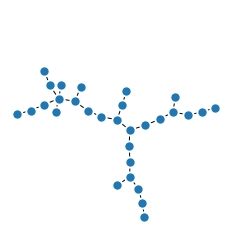

In [ ]:
# a less interactive but quick snapshot of our graph
km.drawing.draw_matplotlib(graph, layout='kk')
plt.show()

cube0_cluster0
cube1_cluster0
cube2_cluster0
[[ 0.00241252  0.17346132 -0.06458342]
 [ 0.01636389  0.17462157 -0.06464217]
 [-0.0029749   0.10513009 -0.06700588]
 [-0.04160342 -0.09130019  0.05069966]
 [-0.02497447 -0.11385047  0.04503318]
 [-0.02975304 -0.14776988  0.11829905]
 [-0.02334263 -0.03824105 -0.03075626]
 [-0.01705935 -0.08373893 -0.00815951]
 [ 0.00031912 -0.06532575 -0.04095571]
 [-0.0046732   0.03166413 -0.06537498]
 [-0.00518818 -0.10378882  0.0007592 ]
 [-0.01921179  0.0785586  -0.05857202]
 [-0.03714571 -0.05302977  0.00778685]
 [-0.01258335  0.15716615 -0.05952404]
 [-0.01461277  0.0032808  -0.05634093]
 [-0.09011492 -0.04638123  0.1325649 ]
 [-0.04915081 -0.11829731  0.11572585]
 [-0.11654035  0.02164346  0.14322802]
 [-0.08481656 -0.05087209  0.0898983 ]
 [-0.11710478  0.02397309  0.10028679]
 [ 0.02009588  0.10666503 -0.06775838]
 [ 0.06092793 -0.09130019  0.05069966]
 [ 0.03613747 -0.11224812  0.02724836]
 [ 0.05611223 -0.13408145  0.11074317]
 [ 0.02164475  0.02

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:57: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


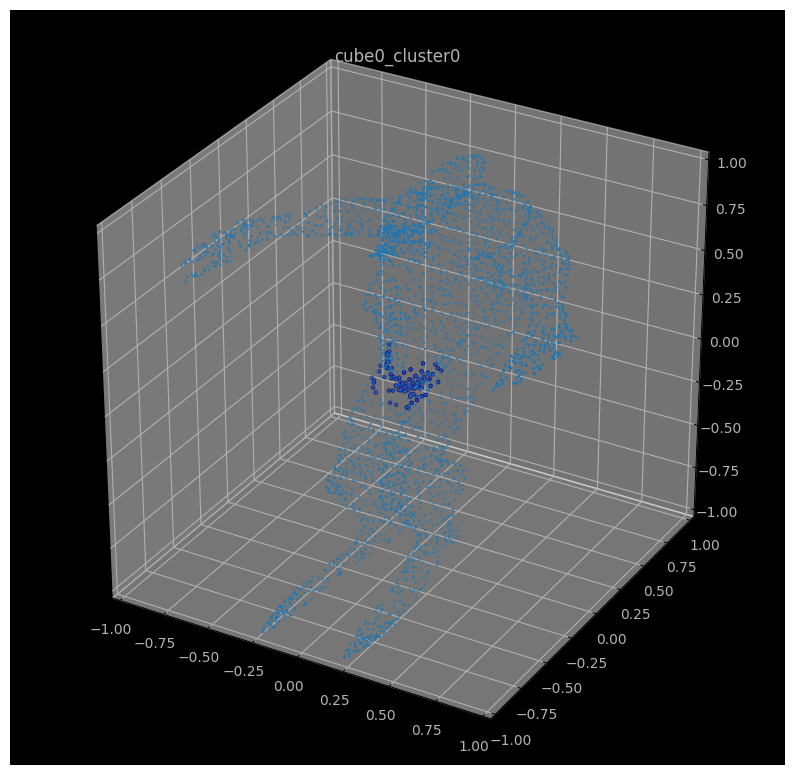

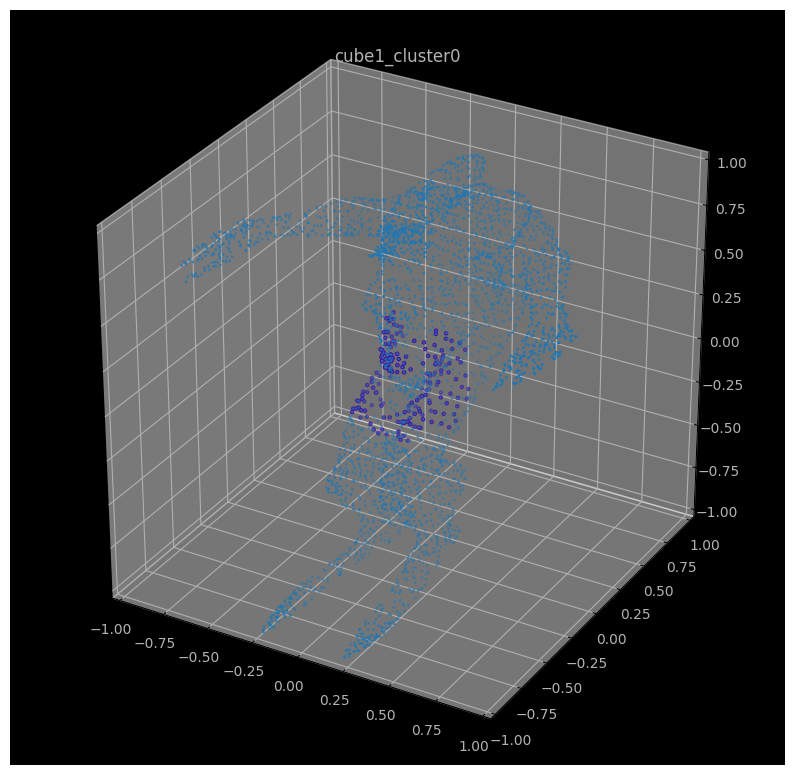

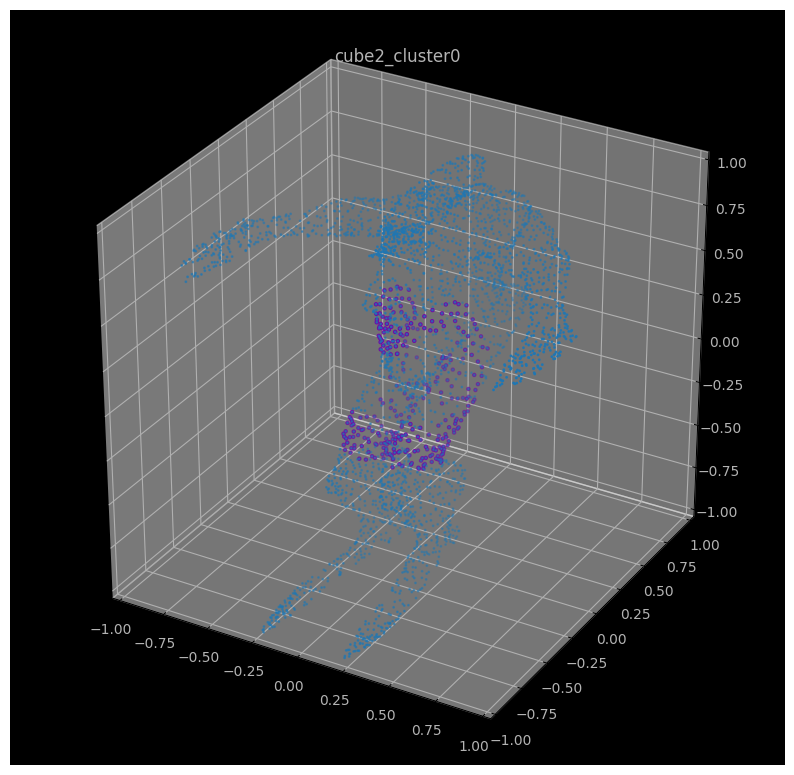

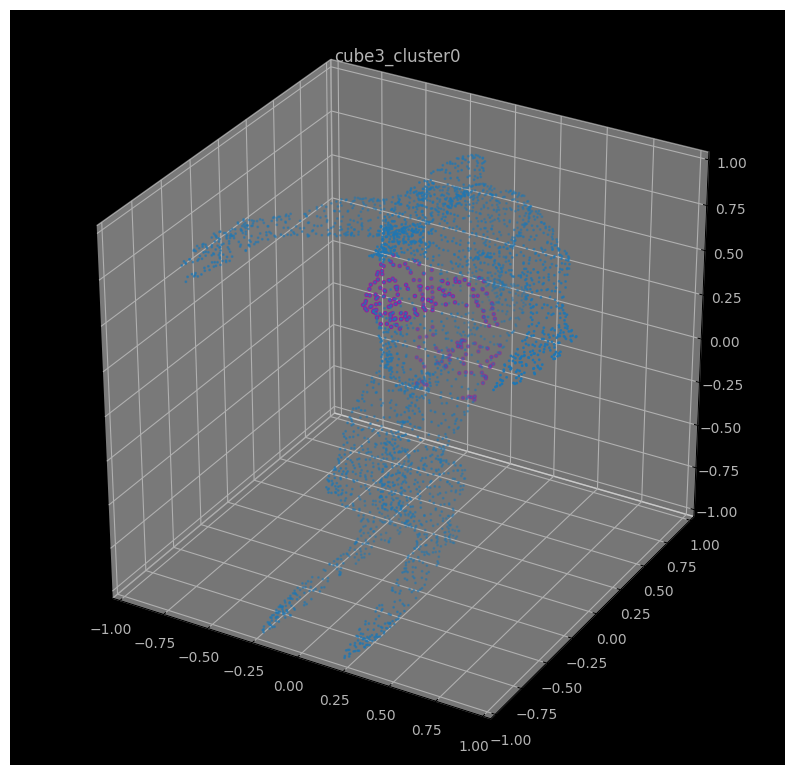

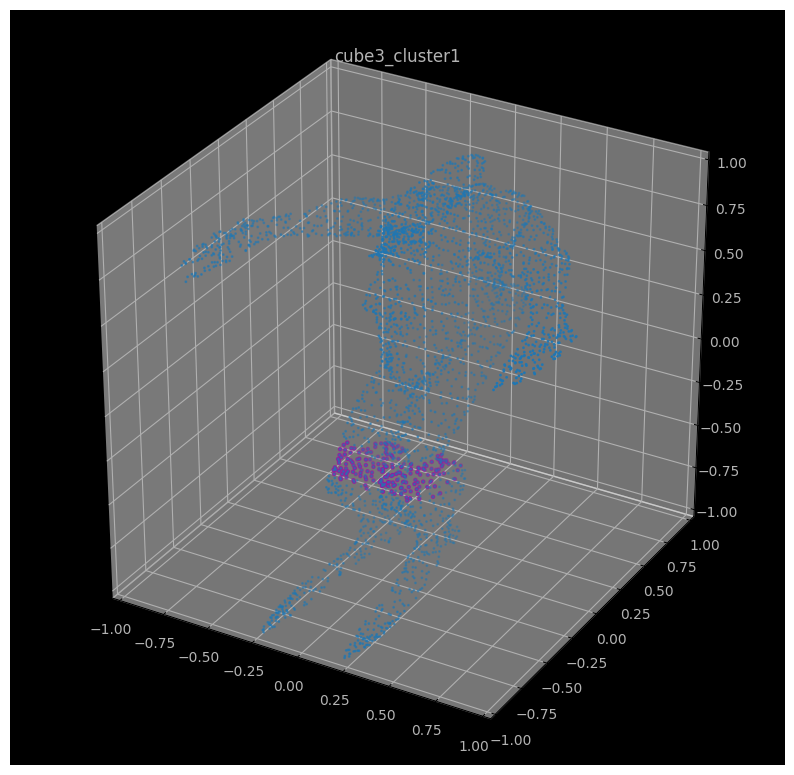

...

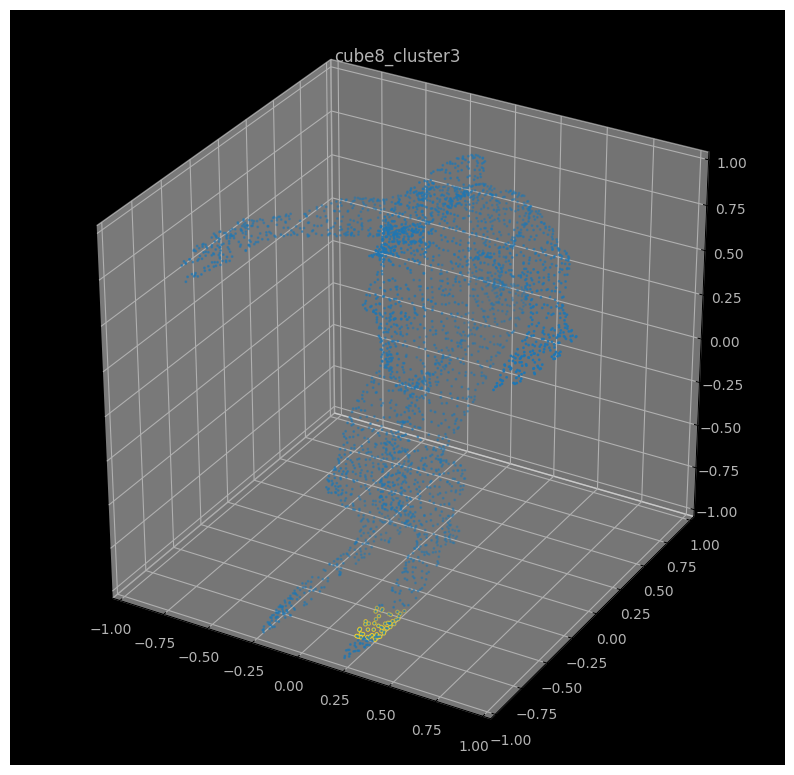

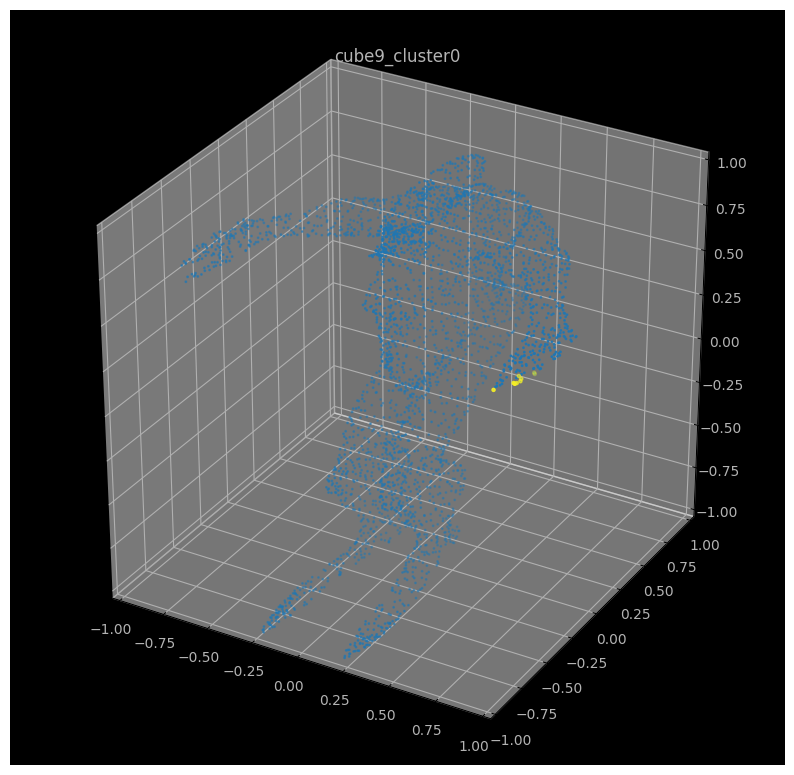

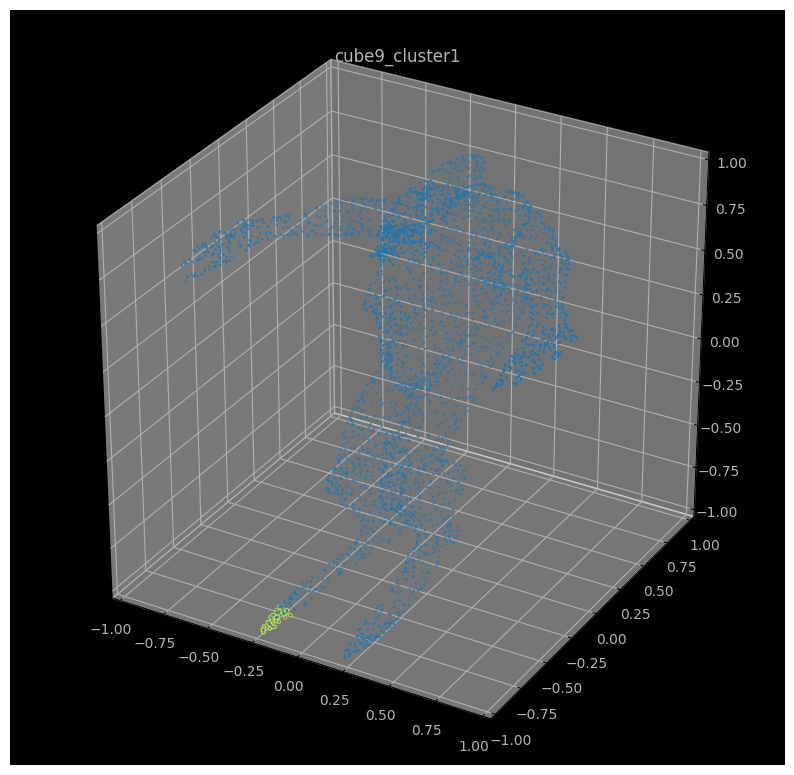

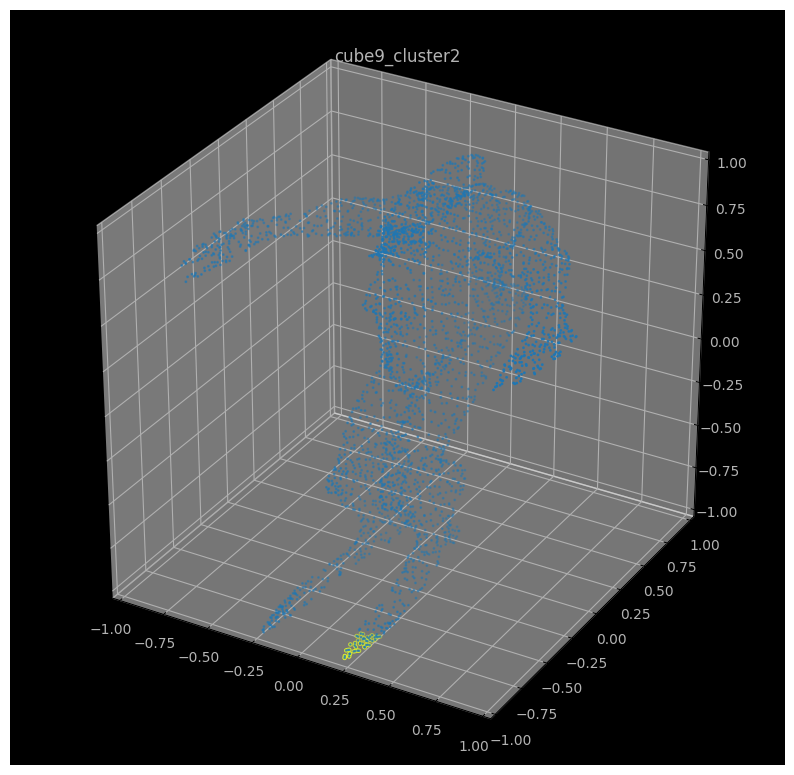

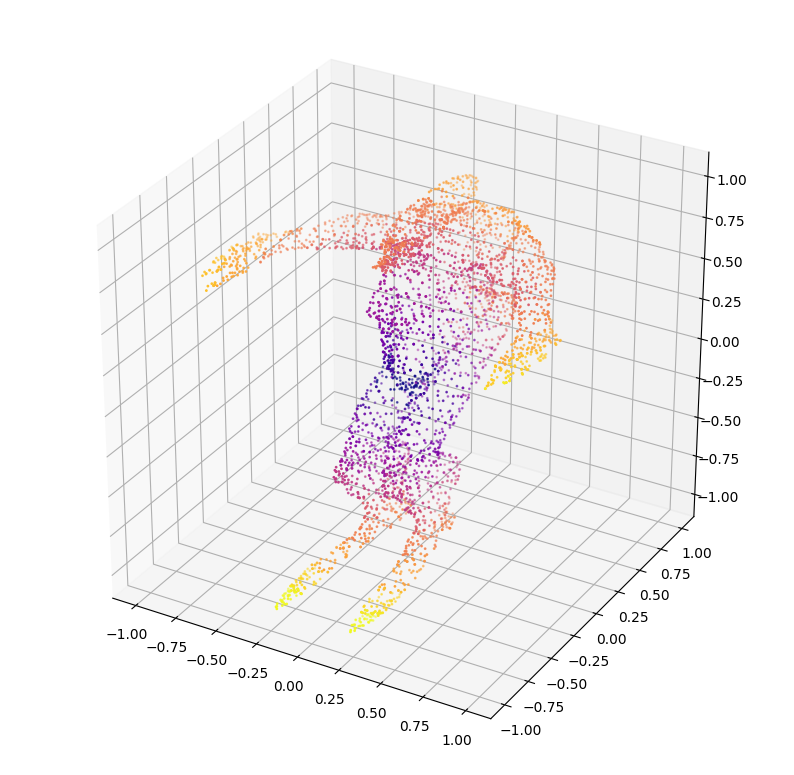

In [ ]:
# now try and map the nodes from the graph back to our point cloud and color code
import matplotlib.cm
import matplotlib.colors

# iterate through the key simpleces for lists that have length one, corresponding to the number of 0-simpleces (nodes) in our graph
node_names = []
for i in graph['simplices']:
  if len(i) == 1:
    node_names.append(i[0])

# take a look at the first few node names in our graph
print(node_names[0])
print(node_names[1])
print(node_names[2])

# now use the kmapper method data_from_cluster_id to find out which points in the original point cloud are in which nodes
clusters = []
for i in node_names:
  clusters.append(mapper.data_from_cluster_id(i, graph, data_norm))

# take a look at which points are in the first nodes in our graph
print(clusters[0])
print(type(clusters[0]))
print(np.shape(clusters))

# now color code based on clusters. Each cluster is colored based on the average l2-norm, so do the same here.
avg_norms = np.zeros(len(clusters))
for i, cluster in enumerate(clusters):
  norm_sum = 0
  for j in cluster:
    norm_sum += np.linalg.norm(j)
  
  avg_norms[i] = norm_sum/len(cluster)

# take a look at the average norms for each cluster and make sure this agrees with the output in the html file from kmapper
print(avg_norms)

# now we want to color the points in each cluster on the original point cloud according to the color in graph representation
cmap = matplotlib.cm.get_cmap('plasma')
norm_color = matplotlib.colors.Normalize(vmin=min(avg_norms), vmax=max(avg_norms))

# make a separate plot for cluster/node
for i in range(0, len(avg_norms)):
  fig = plt.figure(figsize=(10,10), dpi=100)
  ax = fig.add_subplot(111, projection='3d')
  cluster_color_i = cmap(norm_color(avg_norms[i])) 
  ax.scatter(data_norm[:,0], data_norm[:,1], data_norm[:,2], s=1)
  ax.scatter(clusters[i][:,0], clusters[i][:,1], clusters[i][:,2], norm=norm_color, color=cluster_color_i, cmap='plasma', s=5)
  ax.set_facecolor('k')
  ax.set_title(node_names[i], color='.7')
  ax.set_xlim(left=-1, right=1)
  ax.set_ylim(bottom=-1, top=1)
  ax.set_zlim(bottom=-1, top=1)
  ax.tick_params(labelcolor='.7')

# now plot all clusters/nodes together together
fig = plt.figure(figsize=(10,10), dpi=100)
ax = fig.add_subplot(111, projection='3d')
for i in range(len(avg_norms)):
  cmap = matplotlib.cm.get_cmap('plasma')
  cluster_color_i = cmap(norm_color(avg_norms[i])) 

  ax.scatter(clusters[i][:,0], clusters[i][:,1], clusters[i][:,2], norm=norm_color, color=cluster_color_i, cmap='plasma', s=1)

plt.show()